In [32]:
import pandas as pd
import json
import numpy as np
from collections import defaultdict
import os
import statistics
# import imageio

In [3]:
mosaic_df = pd.read_csv('mosaic_peers.csv')

In [8]:
mosaic_df['Input.image'].value_counts()

horse_1_2.jpg    30
horse_1_0.jpg    29
horse_0_1.jpg    29
horse_1_3.jpg    29
horse_2_3.jpg    29
horse_2_0.jpg    28
horse_0_3.jpg    28
horse_2_1.jpg    28
horse_0_2.jpg    28
horse_2_2.jpg    28
horse_1_1.jpg    26
horse_0_0.jpg    26
Name: Input.image, dtype: int64

In [42]:
segments = defaultdict(list)

# each segment has list of responses
# each response has list of lines (might be undone)
# each line has data field with list of points

undo_usage = 0

lines_per_segment = defaultdict(list)
total_num_lines = 0
num_hits = 0 

for _, row in mosaic_df.iterrows():
    num_hits += 1
    worker_id = row['WorkerId']
    segment = row['Input.image']
    response = row['Answer.response']
    response = json.loads(response)
    
    num_lines = sum(1 for line in response if line['undoTimestamp'] is None)
    lines_per_segment[segment].append(num_lines)
    total_num_lines += num_lines

    points = []

    for line in response:
        if line['undoTimestamp'] is not None:
            undo_usage += 1
            continue
            
        for point in line['data']:
            points.append((round(point['x']), round(point['y']), point['timestamp']))

    segments[segment].append(points)

print(undo_usage)

26


In [34]:
for segment, num_lines in lines_per_segment.items():
    print(segment, 'mean =', statistics.mean(num_lines), 'median =', statistics.median(num_lines))

horse_0_0.jpg mean = 1.5384615384615385 median = 1.0
horse_0_1.jpg mean = 2.7241379310344827 median = 1
horse_0_2.jpg mean = 0.21428571428571427 median = 0.0
horse_0_3.jpg mean = 0.32142857142857145 median = 0.0
horse_1_0.jpg mean = 1.4482758620689655 median = 1
horse_1_1.jpg mean = 5.076923076923077 median = 3.0
horse_1_2.jpg mean = 5.3 median = 3.5
horse_1_3.jpg mean = 7.241379310344827 median = 4
horse_2_0.jpg mean = 0.4642857142857143 median = 0.0
horse_2_1.jpg mean = 3.6785714285714284 median = 3.0
horse_2_2.jpg mean = 2.2857142857142856 median = 1.5
horse_2_3.jpg mean = 2.0689655172413794 median = 1


In [44]:
print(total_num_lines)
print(num_hits)

917
338


In [ ]:
def create_image_from_points(img_filename, points):
    img_data = np.zeros((477, 600))
    for x, y, _ in points:
        img_data[y, x] = 1
    imageio.imwrite(img_filename, img_data)

In [25]:
for segment, responses in segments.items():
    create_image_from_points(
        os.path.join('mosaic_segments', segment),
        responses[0],
    )

NameError: name 'create_image_from_points' is not defined

In [17]:
segments

defaultdict(list,
            {'horse_0_0.jpg': [[{'data': [{'x': 511,
                  'y': 477.875,
                  'timestamp': 1556209992702},
                 {'x': 510, 'y': 476.875, 'timestamp': 1556209992997},
                 {'x': 510, 'y': 475.875, 'timestamp': 1556209993016},
                 {'x': 510, 'y': 474.875, 'timestamp': 1556209993032},
                 {'x': 511, 'y': 473.875, 'timestamp': 1556209993049},
                 {'x': 511, 'y': 472.875, 'timestamp': 1556209993066},
                 {'x': 512, 'y': 471.875, 'timestamp': 1556209993083},
                 {'x': 513, 'y': 470.875, 'timestamp': 1556209993100},
                 {'x': 513, 'y': 469.875, 'timestamp': 1556209993116},
                 {'x': 514, 'y': 468.875, 'timestamp': 1556209993132},
                 {'x': 515, 'y': 467.875, 'timestamp': 1556209993149},
                 {'x': 516, 'y': 466.875, 'timestamp': 1556209993166},
                 {'x': 516, 'y': 465.875, 'timestamp': 1556209993182}

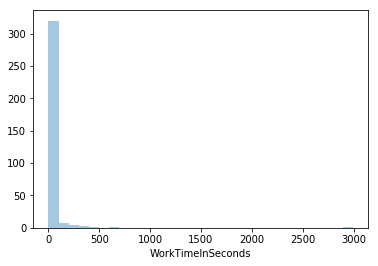

In [7]:
import seaborn as sns
sns.distplot(mosaic_df['WorkTimeInSeconds'], bins=30, hist=True, kde=False)

In [8]:
mosaic_df['WorkTimeInSeconds'].describe()

count     338.000000
mean       46.059172
std       171.683209
min         2.000000
25%        10.000000
50%        21.000000
75%        42.000000
max      2991.000000
Name: WorkTimeInSeconds, dtype: float64

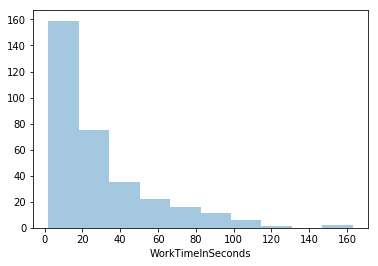

In [27]:
sns.distplot(mosaic_df['WorkTimeInSeconds'].sort_values()[:-11], bins=10, hist=True, kde=False)

In [45]:
mosaic_df['WorkTimeInSeconds'].sort_values()

63        2
107       3
245       3
66        3
237       3
235       3
233       3
83        3
88        3
229       3
92        3
85        3
105       3
109       3
248       3
227       4
74        4
106       4
67        4
236       4
241       4
78        4
104       4
71        4
68        4
249       4
86        4
87        4
55        4
226       4
       ... 
166      83
40       83
217      84
218      85
178      86
247      88
154      90
22       93
155      95
35       95
276     100
273     100
207     102
214     106
162     107
168     113
201     117
82      160
284     163
131     186
255     219
101     248
210     256
263     280
223     306
216     321
183     336
95      404
117     661
320    2991
Name: WorkTimeInSeconds, Length: 338, dtype: int64

In [29]:
len(mosaic_df['WorkerId'].value_counts())

31